## Data

**[EN]** The markup is in the xmls folder, the pictures are in images.

In [1]:
import torch
from xml.etree import ElementTree as ET
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from pathlib import Path
import glob
import numpy as np
from PIL import Image
import torchvision
from torchvision.models import ResNet50_Weights
from tqdm.notebook import tqdm
from torch import nn
import shutil
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import cv2

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


# Get data from XML

Since you will have to read from xml files, you need to add the get_xml_data function before this in order to pull up annotations based on the name of the picture. A function can and should be passed a certain class_dict. It is also present when initializing the dataset below. With its help you can turn the class name into int. Further, it is assumed that the class comes as int.


In [2]:
import os
import glob
import xml.etree.ElementTree as ET

def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
    filename_base = os.path.splitext(os.path.basename(image_name))[0]  # Extract image filename without extension
    xml_dir = os.path.join(root, xml_prefix.lstrip("/"))  # Ensure correct XML directory path

    # 🔹 Find the actual XML file using a wildcard match
    xml_files = glob.glob(os.path.join(xml_dir, f"{filename_base}*.xml"))

    if not xml_files:
        print(f"❌ Error: XML file not found for {filename_base} in {xml_dir}")
        return []

    # ✅ Use the first matching XML file
    xml_path = xml_files[0]

    try:
        tree = ET.parse(xml_path)
    except Exception as e:
        print(f"❌ Error parsing XML: {xml_path} - {e}")
        return []

    treeroot = tree.getroot()
    bboxes = []
    
    for obj in treeroot.findall("object"):
        name = obj.find('name').text.strip()

        if name not in class_dict:
            # print(f"⚠️ Warning: Class '{name}' not found in class_dict. Skipping!")
            continue

        xmin = int(obj.find("bndbox/xmin").text)
        ymin = int(obj.find("bndbox/ymin").text)
        xmax = int(obj.find("bndbox/xmax").text)
        ymax = int(obj.find("bndbox/ymax").text)

        # Ensure bounding box is valid
        if xmin >= xmax or ymin >= ymax:
            print(f"⚠️ Warning: Invalid bbox {xmin, ymin, xmax, ymax} for {filename_base}. Skipping!")
            continue

        bbox = [xmin, ymin, xmax, ymax, class_dict[name]]
        bboxes.append(bbox)

    if not bboxes:
        # print(f" Warning: No valid bounding boxes found in {filename_base}")
        pass
    
    # print(f"Extracted bounding boxes for {filename_base}: {bboxes}")
    return bboxes


**Below you can see what the xml for images looks like. We need to get the target and bbox.**


In [3]:
# with open("/kaggle/working/data/xmls/cam_image1.xml") as annot_file:
with open("/kaggle/input/dataset-for-resnet/images_with_xml/xmls/aug_100_jpg.rf.6e34e53b33af89ed74afa8b25caa0bd6.xml") as annot_file:
    print(''.join(annot_file.readlines()))

<annotation><folder>images</folder><filename>aug_100_jpg.rf.6e34e53b33af89ed74afa8b25caa0bd6.jpg</filename><size><width>640</width><height>640</height><depth>3</depth></size><object><name>Saag</name><bndbox><xmin>0</xmin><ymin>10</ymin><xmax>640</xmax><ymax>622</ymax></bndbox></object></annotation>


**[EN]** Let's check the functionality of the written function.


In [4]:
import json

root = "/kaggle/input/dataset-for-resnet/images_with_xml"
filenames = np.array(glob.glob(root + "/images/*"))
image_name = root + "/xmls/" + filenames[0]
# image_name = "/kaggle/working/data/xmls/cam_image1.xml"
image_name = "/kaggle/input/dataset-for-resnet/images_with_xml/xmls/aug_103_jpg.rf.b5127e86e6cbc113eff0f68952915cf3.xml"
# with open(str(root) + "/class_dict", "r") as f:
#     class_dict = eval(f.readline())

# Read class_dict safely
with open(f"{root}/class_dict", "r") as f:
    class_dict_content = f.read().strip()  # Read entire file and strip extra spaces
    class_dict = json.loads(class_dict_content)  # Parse JSON safely

# Print to verify
print("Class Dictionary Loaded:", class_dict)

Class Dictionary Loaded: {'Baji': 0, 'Dakulaa': 1, 'Dhau': 2, 'aaloo': 3, 'bara': 4, 'bhutan': 5, 'bhuti': 6, 'channa': 7, 'egg': 8, 'kachhila': 9, 'lainTarkari': 10, 'lainachhar': 11, 'saag': 12, 'sapumicha': 13, 'thoo': 14, 'yomari': 15}


In [5]:
class_dict

{'Baji': 0,
 'Dakulaa': 1,
 'Dhau': 2,
 'aaloo': 3,
 'bara': 4,
 'bhutan': 5,
 'bhuti': 6,
 'channa': 7,
 'egg': 8,
 'kachhila': 9,
 'lainTarkari': 10,
 'lainachhar': 11,
 'saag': 12,
 'sapumicha': 13,
 'thoo': 14,
 'yomari': 15}

In [6]:
get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/")

[[35, 45, 640, 639, 13]]

In [7]:
image_name = "/kaggle/input/dataset-for-resnet/images_with_xml/images/aug_109_jpg.rf.feb3fec43c7b123ff9bfc62aa6366816.jpg"

# Verify if class_dict is loaded correctly
print("Loaded class_dict:", class_dict)

# Test if XML parsing works correctly
bbox_data = get_xml_data(image_name, root, class_dict)
print("Bounding Box Data:", bbox_data)


Loaded class_dict: {'Baji': 0, 'Dakulaa': 1, 'Dhau': 2, 'aaloo': 3, 'bara': 4, 'bhutan': 5, 'bhuti': 6, 'channa': 7, 'egg': 8, 'kachhila': 9, 'lainTarkari': 10, 'lainachhar': 11, 'saag': 12, 'sapumicha': 13, 'thoo': 14, 'yomari': 15}
Bounding Box Data: []


**[EN]** Below is the code for a standard Dataset from the pytorch library. Dataset requires implementation of `__getitem__` and `__len__` methods. Next, these methods will be used to generate batches for training.

In [8]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        self.root = Path(root)
        self.transform = transform

        assert self.root.is_dir(), f"No data at `{root}`"

        self.filenames = np.array(glob.glob(str(self.root / "images") + "/*"))

        # ✅ Safely Read `class_dict` (Supports Multi-line JSON)
        class_dict_path = str(self.root / "class_dict")
        with open(class_dict_path, "r") as f:
            class_dict_content = f.read().strip()  # Read entire file
            self.class_dict = json.loads(class_dict_content)  # Convert JSON string to dictionary

        # ✅ Create an inverse mapping (ID → Class Name)
        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}

        np.random.seed(seed)
        permutation = np.random.permutation(len(self.filenames))

        # ✅ Train-test split (80% train, 20% test)
        if train:
            self.filenames = self.filenames[permutation[: int(len(self.filenames) * 0.7)]].tolist()
        else:
            self.filenames = self.filenames[permutation[int(len(self.filenames) * 0.3) :]].tolist()

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        image = np.array(Image.open(fname).convert("RGB"))
        bboxes = get_xml_data(fname, self.root, self.class_dict)

        return self.transform(image=image, bboxes=bboxes)

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        return len(self.filenames)

**[EN]** Total images in the archive:


In [9]:
len(np.array(glob.glob(root + "/images/*")))

7495

 Below we define standard normalizations and size reduction to 512x512.


In [10]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

In [11]:
train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ],
    bbox_params=A.BboxParams(format="pascal_voc", min_visibility=0.0),  # Fix: Ensure no bbox is removed
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ],
    bbox_params=A.BboxParams(format="pascal_voc", min_visibility=0.0),  # Fix: Ensure no bbox is removed
)


In [12]:
train_ds = PascalDataset(root="/kaggle/input/dataset-for-resnet/images_with_xml", transform=train_transform, train=True)
test_ds = PascalDataset(root="/kaggle/input/dataset-for-resnet/images_with_xml", transform=test_transform, train=False)

# Visualize

Now that we've loaded the data, it's a good idea to take a look at it before training any models. Let's write a function `visualize` that takes lists of images and rectangles as input and draws these rectangles on the images.

The dataset has `class_dict_inv`, which allows you to do the reverse conversion: int, containing the class, in a line with the name.

First, let's roll back the image normalization. Let's write a function `back_normalize` that will do this.



In [13]:
def back_normalize(img, mean, std, max_pixel_value=255.0):
    mean = np.array(mean, dtype=np.float32)
    mean *= max_pixel_value

    std = np.array(std, dtype=np.float32)
    std *= max_pixel_value

    img = torch.permute(img, (1, 2, 0))

    img = np.asarray(img).astype(np.float32)
    img *= std
    img += mean
    return np.around(img).astype(np.int32)

In [14]:
BOX_COLOR = (0, 255, 0)
TEXT_COLOR = (0, 0, 0)

def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    x_min, y_min, x_max, y_max = bbox
    x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)

    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)

    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35,
        color=TEXT_COLOR,
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(images, bboxes_class):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    all_bboxes = [np.asarray([el[:-1] for el in bbox], dtype=float) for bbox in bboxes_class]
    all_category_ids = [np.asarray([el[-1] for el in bbox], dtype=float).astype(int).tolist() for bbox in bboxes_class]
    category_id_to_name = train_ds.class_dict_inv

    fig, axes = plt.subplots(
        len(images) // 3 if len(images) % 3 == 0 else len(images) // 3 + 1, len(images) if len(images) < 3 else 3, figsize=(16, 12), dpi=100
    )

    done_images = []
    for image, bboxes, category_ids in zip(images, all_bboxes, all_category_ids):
        img = back_normalize(image, mean, std).copy()
        for bbox, category_id in zip(bboxes, category_ids):
            class_name = category_id_to_name[category_id]
            img = visualize_bbox(img, bbox, class_name)
        done_images.append(img)
    plt.axis('off')
    if len(done_images) > 1:
        axes = axes.flatten()
        for img, ax in zip(done_images, axes):
            ax.imshow(img)
    else:
        plt.imshow(done_images[0])
    plt.show()


# https://albumentations.ai/docs/examples/example_bboxes2/

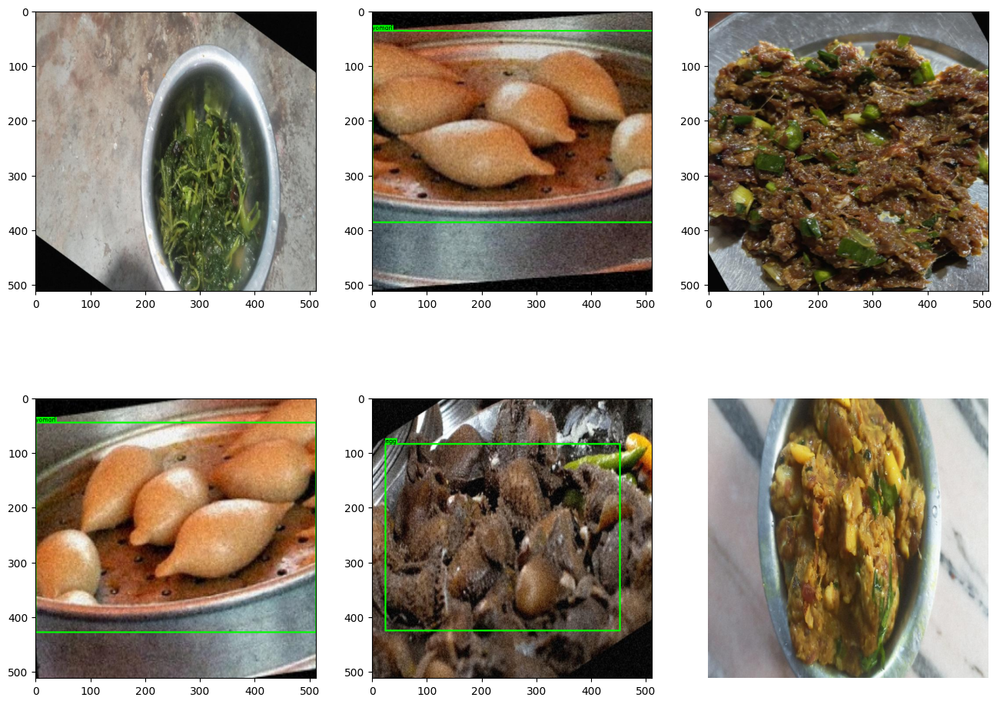

In [15]:
out = [train_ds[i] for i in range(6)]

images = [o["image"] for o in out]
bboxes = [o["bboxes"] for o in out]

visualize(images, bboxes)

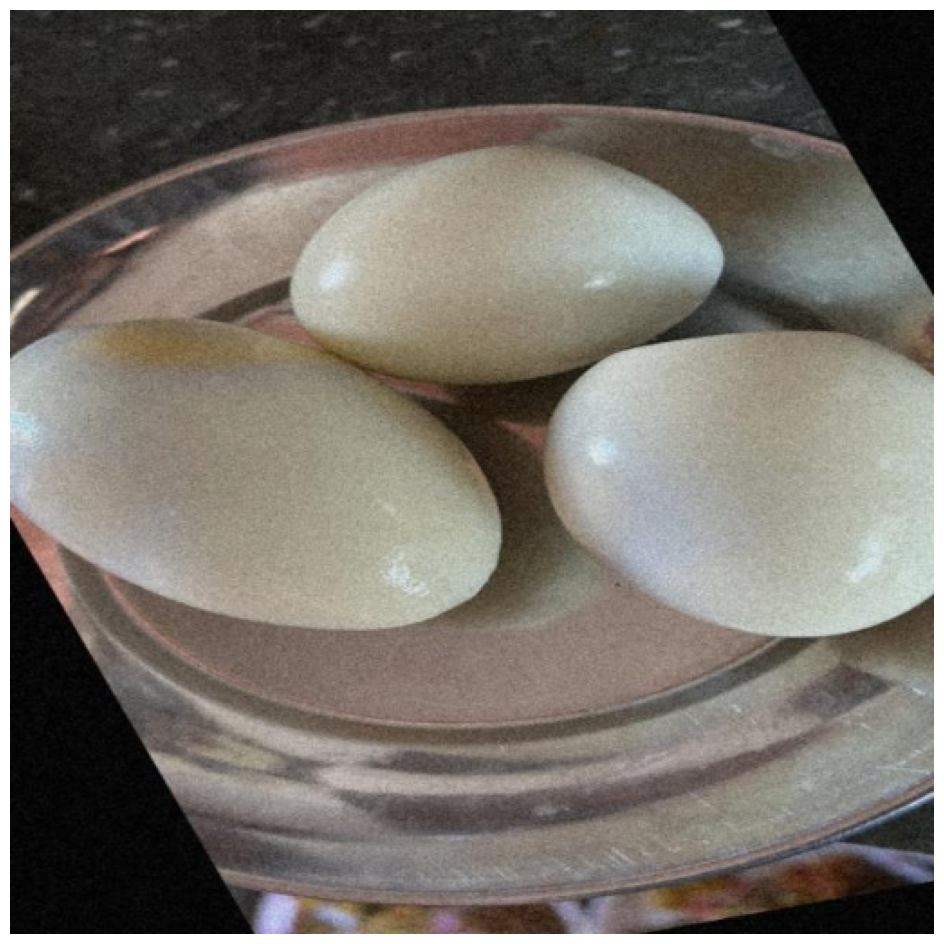

In [16]:
visualize([train_ds[7]['image']], [train_ds[7]['bboxes']])

# YOLO-like detector based on ResNet50

Now we have to implement a detector similar to YOLO. This is one of the simplest detectors in terms of implementation. YOLO is described in the article: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640). Here we will change it a little and simplify it. We will use ResNet to extract features.
At the output we will receive a feature map of size 16x16.


We convert lists of bounding boxes to the target downsampled grid. For this we

* compute centers of bounding boxes ($c_x, c_y$)
* change center coordinates (offset from the top left corner for each corresponding grid cell on a small grid)
* normalize box height and with to $[0, 1]$
* fill the target grid with values

## Collate function

First of all, we need to implement the collate function. This feature will allow us to customize exactly how a batch is constructed from examples (see [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) for details).

This function should take a sheet of rectangles as input and generate a tensor of size Bx16x16x6.
The first dimension is the number of examples in the batch. Next come two spatial dimensions, this is a 16 by 16 grid.

Our channels will contain:
* Shifts of the bbox center relative to the beginning of the cell (a cell is a “pixel” in a 16 by 16 image at the network output). These shifts will be recorded in the cell to which they belong. 2 channels (X, Y)
* Normalized bbox width and height. 2 channels (W, H)
* Confidence grid. We will use it to filter the grid’s confidence in the presence of a bbox in a given cell. The target contains 1 where bbox is present, and 0 otherwise. 1 channel
* Detection class (the same int obtained from the string with the name)



In [17]:
def collate_fn(batch, downsample=32):
    imgs, batch_boxes = zip(*[(b["image"], b["bboxes"]) for b in batch])

    batch_boxes = list(batch_boxes)
    
    for i, boxes in enumerate(batch_boxes):
        if len(boxes) == 0:
            # print(f"Warning: Image {i} has no bounding boxes. Assigning a dummy bbox.")
            batch_boxes[i] = [[0, 0, 1, 1, 0]]  # Assign a dummy bbox (min size, class 0)

    imgs = torch.stack(imgs)
    b, _, h, w = imgs.shape
    target = torch.zeros((b, 6, h // downsample, w // downsample), device=imgs.device)

    for i, boxes in enumerate(batch_boxes):
        xmin, ymin, xmax, ymax, classes = map(
            torch.squeeze, torch.split(torch.tensor(boxes, dtype=torch.float32), 1, dim=-1)
        )

        x_cell = downsample
        y_cell = downsample

        w_box = (xmax - xmin) / w
        h_box = (ymax - ymin) / h
        cx = (xmin + xmax) / 2
        cy = (ymin + ymax) / 2
        cx_idx = cx // x_cell
        cy_idx = cy // y_cell
        cx_box = (cx - x_cell * cx_idx) / x_cell
        cy_box = (cy - y_cell * cy_idx) / y_cell

        target[i, :, cy_idx.long(), cx_idx.long()] = torch.stack(
            [cx_box, cy_box, w_box, h_box, torch.ones_like(cx_box), classes]
        )

    return {"image": imgs, "target": target}


Below you can see an example of what a 16 by 16 grid looks like in the original image:

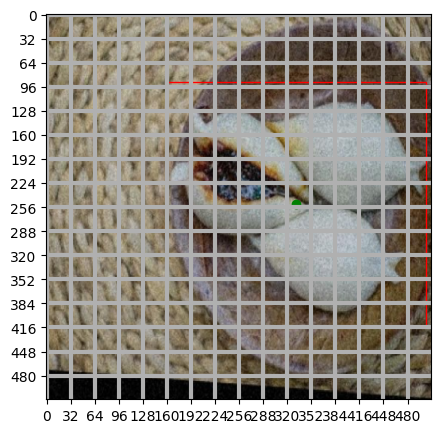

In [18]:
fig, ax = plt.subplots(figsize=(5, 5))
i = 20

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="red"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

# Decode prediction

**[EN]** The output of our mesh will be slightly larger than Bx16x16x6. Why?

We are solving a problem where there is more than one class. Let us recall the problem of multiclassification of pictures: target is one number, but the output of the grid contained a long, long vector, from which we obtain the probability of belonging to a particular class. It's the same here
but as if in two dimensions: each cell from these 16 * 16 will have its own vector of length C, which we will use to determine the class.

Let's implement the inverse of the 'collate_fn' transformation to decode the output of the neural network.
By applying the decode_prediction function to the output of the collate function, we can obtain an initial set of rectangles with the correct sizes and coordinates, as well as classes. By applying a neural network to the output, we should also get a set of rectangles, also with the correct classes.

That is, you need to perform operations from 'collate_fn' in the opposite direction,
but keep in mind that the output of the neuron will be a little longer, and there we must take argmax to determine the class.

Hint: target classes come at the end. In the neuron they will also be at the end, but there will be more than 1 of them. You can check the number of channels of the incoming object, if it is 6, then we have target in front of us and we need to take the value that is written in the cell.
Otherwise (there are more than 6 channels), we have the output of the neuron, and we must take the most probable one.

In [19]:
def decode_prediction(pred, upsample=32, threshold=0.7):
    b, c, h_smp, w_smp = pred.shape
    img_w, img_h = w_smp * upsample, h_smp * upsample

    all_bboxes = []
    for batch in pred:
        if c > 6:
            batch = batch.detach().numpy()
            predicted = np.argmax(batch[5:], axis=0)
            batch[5] = predicted
            batch_prep = batch[:6]
        else:
            batch_prep = batch

        bboxes = []
        for idx_h in range(h_smp):
            for idx_w in range(w_smp):
                # print(idx_h, idx_w)
                if batch_prep[4][idx_h][idx_w] > threshold:
                    cx = batch_prep[0][idx_h][idx_w].item()
                    cy = batch_prep[1][idx_h][idx_w].item()
                    w = batch_prep[2][idx_h][idx_w].item()
                    h = batch_prep[3][idx_h][idx_w].item()
                    cls = batch_prep[5][idx_h][idx_w].item()
                    # print(cx, cy, w, h, cls)

                    center = [(cx + idx_w) * upsample, (cy + idx_h) * upsample]
                    w *= img_w
                    h *= img_h

                    xmin = center[0] - w / 2
                    # print('xmin ', xmin)
                    xmax = center[0] + w / 2
                    # print('xmax ', xmax)
                    ymin = center[1] - h / 2
                    # print('ymin ', ymin)
                    ymax = center[1] + h / 2
                    # print('ymax ', ymax)
                    cls = int(cls)
                    # print('cls ', cls)

                    cortege = (xmin, ymin, xmax, ymax, cls)
                    bboxes.append(cortege)
                    # print(bboxes)

        all_bboxes.append(bboxes)

    return all_bboxes

In [20]:
out = [train_ds[i] for i in range(6)]

test_collate = collate_fn(out)
decode_prediction(test_collate['target'])

[[(0.0, 0.0, 1.0, 1.0, 0)],
 [(0.0, 36.79998779296875, 512.0, 386.3999938964844, 15)],
 [(0.0, 0.0, 1.0, 1.0, 0)],
 [(0.0, 45.600006103515625, 512.0, 428.79998779296875, 15)],
 [(24.79998779296875,
   84.80001831054688,
   452.79998779296875,
   425.6000061035156,
   8)],
 [(0.0, 0.0, 1.0, 1.0, 0)]]

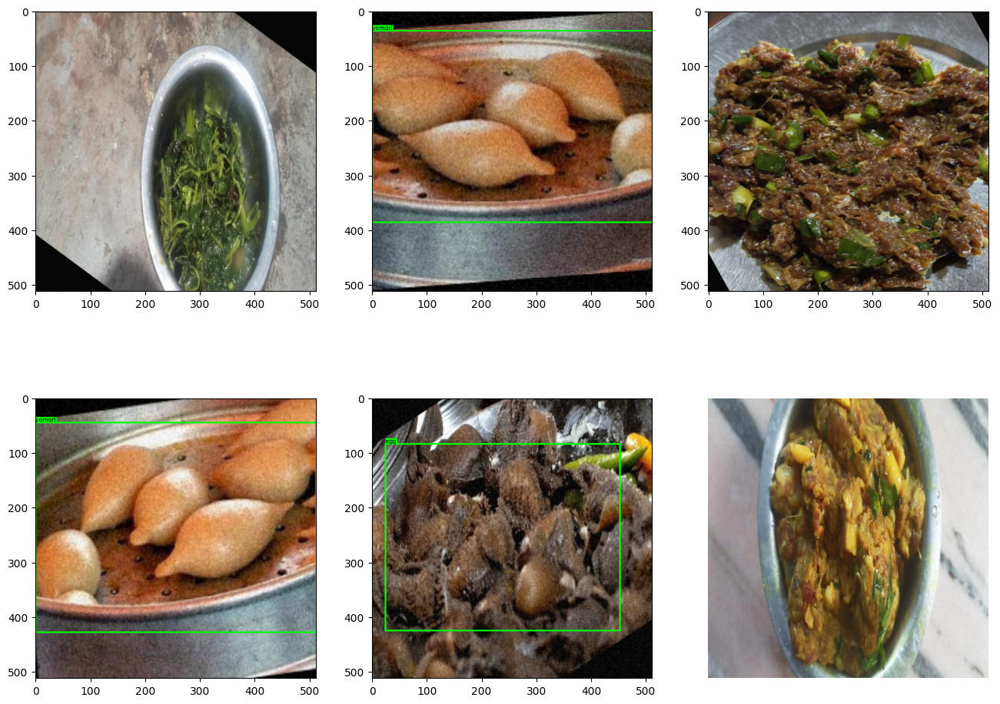

In [21]:
visualize(test_collate['image'], decode_prediction(test_collate['target']))

# Code model

**[EN]** First of all, let’s select the first 4 blocks (up to layer4 inclusive) of ResNet50. Next, let's add several blocks (Conv2D, BatchNorm2D, ReLU). We will gradually reduce the number of channels to 5+C, and the image size to 16 by 16. For example, 2048 -> 512 -> 128 -> 32 -> 5+C, where C is the number of classes in your dataset. The core size is 3, padding is 1.
But there are many options, you can try different ones! **The last layer must be a convolution.** Since all the values ​​that we predict are in the interval from 0 to 1 (thanks to normalization with cells), we will also apply a sigmoid after the final convolution. It won't hurt the classes in this setup.
ResNet50 under the hood will eventually bring the image to our size and the final out. With the fully connected layer removed, the 512x512x3 image will be exactly 16x16x2048, as we need, and then we will reduce the dimension of the channels using convolutional layers to 5+C, without changing the width and height of the tensor.

In [22]:
C =  len(train_ds.class_dict)


class Detector(nn.Module):
    def __init__(self):
        super().__init__()
        model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
        mod_model = list(model.children())[:-2]

        self.resnet50 = nn.Sequential(*mod_model)
        # out -> 16x16x2048

        self.conv1 = nn.Sequential(nn.Conv2d(2048, 512, kernel_size=(3, 3), padding=(1, 1), bias=False),
                                   nn.BatchNorm2d(512, eps=1e-05, momentum=0.1),
                                   nn.ReLU())

        self.conv2 = nn.Sequential(nn.Conv2d(512, 128, kernel_size=(3, 3), padding=(1, 1), bias=False),
                                   nn.BatchNorm2d(128, eps=1e-05, momentum=0.1),
                                   nn.ReLU())

        self.conv3 = nn.Sequential(nn.Conv2d(128, 32, kernel_size=(3, 3), padding=(1, 1), bias=False),
                                   nn.BatchNorm2d(32, eps=1e-05, momentum=0.1),
                                   nn.ReLU())

        self.conv4 = nn.Sequential(nn.Conv2d(32, 5 + C, kernel_size=(3, 3), padding=(1, 1), bias=False),
                                   nn.BatchNorm2d(5 + C, eps=1e-05, momentum=0.1),
                                   nn.ReLU())

        self.conv5 = nn.Conv2d(5 + C, 5 + C, kernel_size=(3, 3), padding=(1, 1), bias=False)

        self.sigmoid = nn.Sigmoid()

    def forward(self, img):

        img = self.resnet50(img)
        img = self.conv1(img)
        img = self.conv2(img)
        img = self.conv3(img)
        img = self.conv4(img)
        img = self.conv5(img)
        img = self.sigmoid(img)

        return img

# Loss

Let's implement the loss function.

For this:
* Let's make a mask that will indicate the position of the detected objects.
* Loss is similar to the original one for Yolo V1 and consists of 4 parts
    - localization loss - We take MSE according to the box coordinates where there is a detected object
    - box_loss - MSE from the roots of the width and height of the bbox there,
where is the detected object
    - classification_loss - If there is a detected object, then its cross-entropy by its class
    - confidence_loss - Binary cross-entropy of the fact of the presence of an object FOR ALL pixels. This is done separately for detectable objects (weight 1) and for non-detectable objects (weight 0.1 for example, since there are many more of them,
but you can experiment)

In [23]:
C = len(class_dict)  # Update number of classes
C

16

In [24]:
def special_loss(pred, target, check=False, C=C, use_yolo_weights=False):
    """
    pred -> model predictions
    target -> ground truth targets
    check -> if True, returns individual loss components, else total loss
    use_yolo_weights -> applies YOLO weights to loss components
    """
    mse = nn.MSELoss(reduction='none')
    cross_entropy = nn.CrossEntropyLoss(reduction='sum')
    bce = nn.BCELoss(reduction='none')

    localization_loss = 0
    box_loss = 0
    classification_loss = 0
    confidence_loss = 0

    for batch_idx in range(len(pred)):
        mask = target[batch_idx][4].ge(1)
        mask_inv = ~mask

        if mask.sum() == 0:
            # print(f"Warning: No positive samples in batch {batch_idx}")
            continue  # Skip batch if no positive labels

        cx_masked_pred = torch.masked_select(pred[batch_idx][0], mask)
        cx_masked_target = torch.masked_select(target[batch_idx][0], mask)
        cy_masked_pred = torch.masked_select(pred[batch_idx][1], mask)
        cy_masked_target = torch.masked_select(target[batch_idx][1], mask)

        localization_loss += torch.sum(mse(cx_masked_pred, cx_masked_target), dim=0)
        localization_loss += torch.sum(mse(cy_masked_pred, cy_masked_target), dim=0)

        w_masked_pred = torch.sqrt(torch.masked_select(pred[batch_idx][2], mask))
        w_masked_target = torch.sqrt(torch.masked_select(target[batch_idx][2], mask))
        h_masked_pred = torch.sqrt(torch.masked_select(pred[batch_idx][3], mask))
        h_masked_target = torch.sqrt(torch.masked_select(target[batch_idx][3], mask))

        box_loss += torch.sum(mse(w_masked_pred, w_masked_target), dim=0)
        box_loss += torch.sum(mse(h_masked_pred, h_masked_target), dim=0)

        cls_list = []
        cls_masked_target = torch.masked_select(target[batch_idx][5], mask)

        # Ensure class indices are valid
        if (cls_masked_target >= C).any():
            # print(f"Error: Invalid class index {cls_masked_target.max()} found!")
            continue  # Skip invalid batch

        cls_channels = pred[batch_idx][5:]
        for curr_cls_idx in range(C):
            cls_masked_pred = torch.masked_select(cls_channels[curr_cls_idx], mask)
            cls_list.append(cls_masked_pred)

        stack_cls = torch.stack(cls_list, dim=1)

        # Validate tensor shapes
        if stack_cls.shape[0] != cls_masked_target.shape[0]:
            # print(f"Shape Mismatch: stack_cls={stack_cls.shape}, target={cls_masked_target.shape}")
            continue

        classification_loss += cross_entropy(stack_cls, cls_masked_target.type(torch.int64))

        conf_masked_target = [torch.masked_select(target[batch_idx][4], mask),
                              torch.masked_select(target[batch_idx][4], mask_inv)]

        conf_masked_pred = [torch.masked_select(pred[batch_idx][4], mask),
                            torch.masked_select(pred[batch_idx][4], mask_inv)]

        weight_detected = 1
        weight_undetected = 0.1

        confidence_loss += torch.sum(weight_detected * bce(conf_masked_pred[0], conf_masked_target[0]))
        confidence_loss += torch.sum(weight_undetected * bce(conf_masked_pred[1], conf_masked_target[1]))

    if not check:
        if not use_yolo_weights:
            return localization_loss + box_loss + classification_loss + confidence_loss
        else:
            return 5 * localization_loss + 5 * box_loss + classification_loss + confidence_loss
    else:
        return localization_loss, box_loss, classification_loss, confidence_loss


# Fit model

Let's train the model (by writing a training cycle) and show that it works (most likely, objects will be found in 1-2 pictures)

In [25]:
loader = torch.utils.data.DataLoader(train_ds, batch_size=10, collate_fn=collate_fn)

test_batch = next(iter(loader))

print("Batch Image Shape:", test_batch["image"].shape)
print("Batch Target Shape:", test_batch["target"].shape)

# Check for valid bounding boxes
print("First Target:", test_batch["target"][0])

# Check if any bounding boxes are still empty
if torch.all(test_batch["target"] == 0):
    # print("ERROR: All bounding boxes are still missing!")
    pass
else:
    # print("✅ Bounding boxes are correctly loaded!")
    pass


Batch Image Shape: torch.Size([10, 3, 512, 512])
Batch Target Shape: torch.Size([10, 6, 16, 16])
First Target: tensor([[[0.0156, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0156, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0020, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.

In [26]:
# import xml.etree.ElementTree as ET

# def get_xml_data(image_name, root, class_dict, xml_prefix=".xml"):
#     xml_file = root + "/" + image_name.split(".")[0] + xml_prefix
#     try:
#         tree = ET.parse(xml_file)
#         treeroot = tree.getroot()  # Ensure treeroot is defined properly
#     except FileNotFoundError:
#         raise FileNotFoundError(f"XML file not found: {xml_file}")
    
#     names = []
    
#     for member in treeroot.findall("object"):  # Now treeroot is defined
#         name = member.find('name').text.strip()
#         print(f"Checking name: '{name}'")  # Debugging

#         if name not in class_dict:
#             raise KeyError(f"Key '{name}' not found in class_dict. Available keys: {list(class_dict.keys())}")

#         names.append(class_dict[name])

#     return names  # Ensure this function returns valid data


# for member in treeroot.findall("object"):
#     name = member.find('name').text.strip()  # Ensure there are no trailing spaces
#     print(f"Checking name: '{name}'")  # Debugging
#     if name not in class_dict:
#         raise ValueError(f"Key '{name}' not found in class_dict. Check class_dict keys: {list(class_dict.keys())}")
#     names.append(class_dict[name])


In [27]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.manual_seed(21)
EPOCHS = 100
model = Detector().to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)

for e in tqdm(range(EPOCHS)):
    model = model.train()
    pbar = tqdm(loader, leave=False)
    epoch_losses = []
    for batch in pbar:
        pred = model(batch['image'].to(device))
        loss = special_loss(pred.to(device), batch['target'].to(device))
        print(loss)
        epoch_losses.append(loss.item())
        loss.backward()
        opt.step()
        opt.zero_grad()


    print(f"Epoch {e} done; Train loss {np.mean(epoch_losses):.3f};")

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 202MB/s]


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(204.5623, device='cuda:0', grad_fn=<AddBackward0>)
tensor(186.4032, device='cuda:0', grad_fn=<AddBackward0>)
tensor(172.9648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(161.1628, device='cuda:0', grad_fn=<AddBackward0>)
tensor(151.6767, device='cuda:0', grad_fn=<AddBackward0>)
tensor(143.1025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(133.9534, device='cuda:0', grad_fn=<AddBackward0>)
tensor(126.3506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(123.2356, device='cuda:0', grad_fn=<AddBackward0>)
tensor(113.4553, device='cuda:0', grad_fn=<AddBackward0>)
tensor(111.7305, device='cuda:0', grad_fn=<AddBackward0>)
tensor(107.7245, device='cuda:0', grad_fn=<AddBackward0>)
tensor(99.3143, device='cuda:0', grad_fn=<AddBackward0>)
tensor(95.4818, device='cuda:0', grad_fn=<AddBackward0>)
tensor(94.7614, device='cuda:0', grad_fn=<AddBackward0>)
tensor(89.3188, device='cuda:0', grad_fn=<AddBackward0>)
tensor(80.7187, device='cuda:0', grad_fn=<AddBackward0>)
tensor(81.3139, dev

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(27.8847, device='cuda:0', grad_fn=<AddBackward0>)
tensor(32.0593, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.6618, device='cuda:0', grad_fn=<AddBackward0>)
tensor(35.3257, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.2024, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.4915, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.4942, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5018, device='cuda:0', grad_fn=<AddBackward0>)
tensor(35.0550, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.7342, device='cuda:0', grad_fn=<AddBackward0>)
tensor(34.3094, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31.7566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.3916, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.9686, device='cuda:0', grad_fn=<AddBackward0>)
tensor(35.0244, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.5891, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.5265, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.1646, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(27.4497, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31.2474, device='cuda:0', grad_fn=<AddBackward0>)
tensor(32.8841, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.5314, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.5858, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.0454, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.5797, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.3998, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.9745, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.7000, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.4097, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31.8442, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.1107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.3982, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.2482, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.0067, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.2572, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.4331, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(28.0525, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31.5624, device='cuda:0', grad_fn=<AddBackward0>)
tensor(32.7732, device='cuda:0', grad_fn=<AddBackward0>)
tensor(32.5827, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.3896, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.6743, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.1639, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6056, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.2722, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.1073, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.7959, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.6687, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.6494, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.4274, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.7512, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.9308, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.4125, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.1057, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(28.4098, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31.5007, device='cuda:0', grad_fn=<AddBackward0>)
tensor(32.6246, device='cuda:0', grad_fn=<AddBackward0>)
tensor(32.5253, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.4282, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.7313, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.8288, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.8042, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.4298, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.5154, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.4305, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.7958, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.8804, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.1843, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.7197, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.7456, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.4627, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.9573, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(27.3147, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.2634, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.2516, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31.5584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0336, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.2851, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.9769, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.5357, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31.9575, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0108, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.2704, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.3939, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.2359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.9950, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.2955, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.4761, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.4708, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.7211, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(27.2995, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.2359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.9283, device='cuda:0', grad_fn=<AddBackward0>)
tensor(31.4786, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.1824, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.2102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.9278, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1482, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.9058, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.9290, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.6189, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.1627, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5043, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.5006, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.8284, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6520, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.8595, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(27.5964, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.3717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(35.4567, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.7449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.7109, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.2916, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.2473, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.3598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.6490, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.2771, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.9843, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.9088, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.3208, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.2025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.4515, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.1252, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6755, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.9633, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(26.9459, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.7577, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.5353, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.8508, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2650, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.8392, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.8460, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2189, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.9196, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.8368, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.7993, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.6123, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2091, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.6259, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.5929, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0225, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5802, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.5982, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(26.6909, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.5671, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.6172, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.1598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6017, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.5514, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2665, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.7843, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.4397, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.3433, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.5446, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.4307, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.3880, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.4696, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.3038, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2353, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.4610, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.1063, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(27.0032, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.4386, device='cuda:0', grad_fn=<AddBackward0>)
tensor(32.4817, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.5274, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5589, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.6137, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.3340, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0492, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.3491, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2716, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.2655, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.2785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6481, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.5596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.8077, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6625, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.7223, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.1920, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(27.1208, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.2308, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.9682, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.3660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6870, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.5858, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6674, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.4845, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.7583, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.9011, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.0658, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.6778, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6435, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.7162, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.6474, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.9739, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.9898, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.1806, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(26.2481, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.2266, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.9948, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.8153, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0720, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.8455, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.8343, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.3670, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.1156, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2028, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.1507, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.9134, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0276, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.4369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.1589, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6789, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.4856, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.8220, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(24.9511, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.9430, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.9187, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.2987, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0422, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.8228, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1995, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1069, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.9738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.7031, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.5702, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.4046, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6830, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6581, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.0217, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1963, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2195, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2555, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(24.9499, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.9237, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.7633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.3844, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6685, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.4569, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0326, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5312, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.7369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0858, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.8654, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.1485, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6905, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.1236, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.6025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.9107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.4504, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.6375, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(25.8630, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.5066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.6238, device='cuda:0', grad_fn=<AddBackward0>)
tensor(29.5316, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1489, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.2695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.7869, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8187, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.0379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5684, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.6464, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.1793, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.2242, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.1200, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2753, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.7718, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.7662, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(25.4754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.5132, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.5973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.2066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.8670, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.8422, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.4925, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8498, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.9269, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.7924, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.4854, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.0715, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.9605, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6088, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.7279, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.4440, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6255, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.3276, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(23.4515, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.8126, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0902, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.6734, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0650, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.3670, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.7406, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.9396, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6302, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.5676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.6876, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.6971, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0874, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.7355, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.2037, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.9538, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3900, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.4254, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.9303, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.3842, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.5227, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2187, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5917, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5316, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9318, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1705, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0300, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5950, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.4831, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2991, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6315, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2724, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3628, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.8725, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(22.3543, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.0125, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.1317, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.7353, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0323, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.5950, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(30.0636, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5357, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.1019, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.3931, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.8819, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0354, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5401, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.9091, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6840, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6847, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(22.0868, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.9471, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.8256, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.9688, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1165, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.5000, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2135, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.5110, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3770, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.7202, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.7237, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5705, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0230, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6953, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.9602, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.7065, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.2776, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.3522, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.9580, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.7149, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5830, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.2767, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1201, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1698, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.7673, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3377, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6081, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2495, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2253, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.4212, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.1238, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0901, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.1715, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3003, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6602, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2229, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2914, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1208, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5008, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.9976, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.0876, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5927, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1316, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5451, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4206, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.4891, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6295, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.8785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0412, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.5830, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.4330, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4227, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.7978, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6513, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7034, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5304, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1716, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.3919, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.4114, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1904, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.9120, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7285, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6628, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1362, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.5726, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.9937, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2565, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.7666, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1800, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5037, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5285, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7998, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0700, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1908, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.8066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1470, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.4992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1607, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8916, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0340, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.8050, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.0785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.7496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1166, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9935, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8908, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7005, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.4188, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.8622, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2675, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5486, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6601, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3085, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2656, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7179, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1303, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.8246, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.3918, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6452, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.8681, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1341, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.8096, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0521, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2748, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2601, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7386, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0650, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6047, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5912, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9727, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.8277, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9705, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3380, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.6148, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.3679, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0060, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2624, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9281, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5204, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5691, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6505, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5304, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2577, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.9324, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1282, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2859, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1914, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8978, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9271, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1133, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.7146, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6061, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.8750, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5705, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.4709, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4151, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6353, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2173, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8028, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0828, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1981, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0072, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4282, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5591, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4330, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.0565, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2153, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.7466, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.4525, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1119, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7849, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0522, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4065, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7042, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8448, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3220, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0319, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6628, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.3233, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3246, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3884, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.4406, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8313, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2509, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6791, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4534, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0661, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4924, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0762, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2421, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5599, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9629, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6808, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2706, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4372, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1293, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4635, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.7893, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.2714, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0080, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2053, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.8117, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6530, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9939, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7227, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.5148, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0815, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5690, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8021, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0834, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8496, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7745, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7460, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7628, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.2346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6213, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.7846, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1502, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5133, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9713, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8797, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3703, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0444, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1780, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0413, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4871, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9651, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2903, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2321, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9188, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.8757, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6366, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.5273, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6672, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0529, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6338, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8428, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5425, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0298, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7674, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0428, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1629, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4916, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3822, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4572, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(22.4376, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9444, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9792, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2287, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4461, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0578, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9084, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7574, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4544, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4503, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8748, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5933, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6949, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0337, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1390, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3427, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.8991, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.7615, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1139, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6634, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8420, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0478, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2126, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1409, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3152, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.4663, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9338, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6207, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0905, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.7425, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1331, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1773, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.8485, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0207, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2965, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.0814, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5502, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2246, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9159, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9896, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.8802, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7881, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4860, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2257, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9673, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8720, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5519, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8608, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.1554, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7689, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7273, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1175, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1677, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6910, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1617, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7662, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1822, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3855, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5459, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0269, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7017, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7525, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1795, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.8597, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7425, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4976, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.4693, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3082, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.4171, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0804, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.4485, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9700, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6162, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2871, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5212, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9696, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6912, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3727, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5892, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2685, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.6874, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7364, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3422, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7244, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5799, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5210, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8867, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0491, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3987, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7288, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1445, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.8817, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3920, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7985, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6857, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6507, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6089, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8636, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.9558, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5559, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8803, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2063, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6686, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.4827, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1526, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0879, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4028, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7453, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9374, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1922, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6104, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1435, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8718, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.1180, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6974, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3171, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9734, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8334, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3327, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8661, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0014, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.5140, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9179, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7191, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2138, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6133, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2763, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1989, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8962, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7215, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.6863, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4445, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6722, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4181, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2128, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3303, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6754, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9898, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5942, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0837, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3235, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3230, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2876, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4187, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5588, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3728, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7567, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.8713, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3270, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1055, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9161, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1433, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3320, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0302, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4608, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0153, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8953, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9869, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4358, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6006, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5619, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3046, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1953, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0831, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.9982, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.8034, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4236, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8907, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7794, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3718, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3815, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5314, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8331, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5606, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8795, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7040, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9694, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0972, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3614, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5367, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7355, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.8199, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5318, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8101, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6029, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9507, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8834, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7401, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6399, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8956, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2542, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9005, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0591, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5069, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1241, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9089, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.6366, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6079, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1446, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8404, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6424, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5488, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4252, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1257, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7337, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8020, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6254, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1149, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2650, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5693, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3060, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.5449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5465, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.0826, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.8883, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2385, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6817, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.8028, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2383, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1514, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9417, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4054, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.8607, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0336, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5698, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.2701, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4191, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6164, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5389, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.5649, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6477, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5396, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0218, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1600, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6151, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5184, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0338, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6971, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8612, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8432, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4117, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2846, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8593, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1370, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3555, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2440, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5266, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.0594, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5068, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9651, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6891, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5057, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8322, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3734, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6361, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0700, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3931, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5978, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.5330, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8549, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7985, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8218, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.6145, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2731, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7296, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1978, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2832, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9818, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3383, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5433, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2877, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0392, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9693, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8464, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2532, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8540, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6715, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7039, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3483, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4019, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3797, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6795, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1115, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5351, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1801, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9535, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8172, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6375, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5884, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2259, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4532, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5282, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2714, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1637, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3667, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3214, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8353, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6247, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5933, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1231, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5560, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2588, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9358, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3662, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6762, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5392, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2414, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3866, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5620, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1985, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2232, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3931, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.6799, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6171, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9053, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6319, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2347, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8041, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6217, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1779, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5953, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9802, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2453, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9003, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5506, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2014, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9531, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8146, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7248, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5407, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3874, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3301, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9309, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9853, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7995, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7888, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1639, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1111, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9228, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5227, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2101, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3837, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4101, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7605, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4225, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4052, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9524, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3335, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2558, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5326, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7367, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5372, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2594, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0649, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8387, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5991, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5947, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3640, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4085, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1088, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4139, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1568, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5432, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.2014, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8842, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5547, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6106, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1826, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4487, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1484, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8815, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5200, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5275, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6750, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1936, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3940, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3954, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2224, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9925, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2985, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.7375, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3522, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8980, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5688, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6849, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5460, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.7618, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6334, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.6707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.1483, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7630, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8057, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.1736, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0173, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0949, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9957, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.4471, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1658, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0318, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0018, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2457, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2991, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6486, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1297, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5149, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7540, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9830, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4541, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8558, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0264, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2186, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5461, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3283, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6962, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6997, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6715, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2228, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6655, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1798, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9381, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9582, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6251, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7290, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2884, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7492, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5100, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2405, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9261, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3834, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.7584, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2757, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5128, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6684, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3686, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3916, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4865, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9401, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9169, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2662, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6896, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2259, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4485, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8030, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9135, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3412, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9595, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7631, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.4037, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5827, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9263, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3058, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3794, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5360, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2148, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0478, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7221, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7938, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2456, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.8921, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0585, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6229, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8756, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8501, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9698, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8922, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3403, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6121, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4655, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6097, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4774, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2339, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9380, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6522, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3446, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5412, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4665, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2179, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3799, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5511, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4194, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6829, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.4209, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7738, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5257, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6015, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1299, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5975, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2190, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9495, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4700, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1524, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1398, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5505, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6853, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3091, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9458, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4052, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.1736, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1218, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1061, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5275, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8124, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9031, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1347, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.4312, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8868, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3434, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0055, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5324, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.3563, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8942, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9166, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7962, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9665, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.4131, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5744, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8018, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0296, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1887, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6492, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4287, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5380, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2337, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1824, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0128, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4807, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2151, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4702, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7861, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6003, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1113, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5761, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.4358, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8341, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8317, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5693, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1913, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4102, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2095, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9570, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3105, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2108, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1286, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5831, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2247, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3665, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3577, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2347, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9824, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4574, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.4415, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4531, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8661, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9036, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2431, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7077, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1853, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4617, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7523, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5108, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9121, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8443, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1294, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3314, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3951, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3686, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0251, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3780, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.2146, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4511, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5364, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1133, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3145, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1943, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9347, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4250, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1627, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5941, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3423, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1258, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2641, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2383, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2724, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9134, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3740, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.4602, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5162, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3281, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3495, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0956, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1679, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1224, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9328, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3875, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0529, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3772, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2583, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1016, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1114, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1700, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2581, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8767, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2627, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.5128, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3546, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7176, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1785, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1270, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8444, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1773, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5872, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5559, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5579, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2214, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7032, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3762, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6554, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2224, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1255, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5028, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.7560, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3537, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3077, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2892, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3529, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0361, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8482, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2875, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.6527, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9912, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5622, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7036, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6796, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9813, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3793, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0535, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3537, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3249, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3889, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4610, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0346, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2530, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0290, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9865, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3737, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1028, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4765, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4437, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1055, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1100, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3157, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3386, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0543, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3847, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1414, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2720, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2021, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2787, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9604, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0651, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9481, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8700, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2140, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9678, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3218, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2434, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0802, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0758, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1282, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9118, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2671, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3858, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4263, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4875, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5076, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3418, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9369, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1101, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3547, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9706, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5395, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2163, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9487, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1810, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9139, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0104, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.4417, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6257, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6860, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5477, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4149, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0568, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2942, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9374, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0265, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3272, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8731, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6173, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1601, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0475, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.5590, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3815, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1562, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3395, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1888, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5317, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6667, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4896, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9711, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3093, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0865, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9356, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8673, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4972, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3638, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6810, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2596, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2675, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3296, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1746, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0318, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3558, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.8023, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4926, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6586, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3539, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0863, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0187, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8969, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3858, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3536, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4273, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0482, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0696, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2216, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1513, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0295, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1340, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1788, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9426, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0935, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9490, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8435, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2562, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9620, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2979, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3057, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9899, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1626, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1108, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1112, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9411, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1049, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.0999, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2450, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6037, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9365, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0685, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9853, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8541, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2561, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9476, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2531, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2024, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0278, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1296, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0704, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0594, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8612, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1183, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.0706, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2036, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.0019, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2706, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9381, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0631, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9461, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8581, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5541, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1184, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5648, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5409, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0360, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9194, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7107, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2491, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1429, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2392, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3615, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7152, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8719, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7196, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0875, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1156, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3653, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.8961, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3864, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7464, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8342, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7049, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2972, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.3191, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7515, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2920, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3782, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.4144, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6954, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3557, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8434, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5342, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2198, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0946, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0160, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7851, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0848, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8217, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4566, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0737, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9450, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3609, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2127, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0611, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3841, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.2782, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2672, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1802, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4842, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9597, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0606, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9850, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8501, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5313, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1148, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2379, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1638, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0184, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2943, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1438, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9860, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9042, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0905, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1772, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2144, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2052, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2067, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9385, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2358, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9802, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8466, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2486, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9971, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1297, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1760, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0103, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0910, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0866, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9569, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9065, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0900, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1554, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2807, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0556, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6356, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9486, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1154, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9517, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8482, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1994, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0838, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1660, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2100, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9747, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1498, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4099, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9905, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8664, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1129, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.2092, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9115, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4007, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6783, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9390, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1996, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9628, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8526, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3059, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9968, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2427, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2101, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0166, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1996, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1945, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1198, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8820, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1625, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(20.1800, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.3448, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2905, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7111, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7809, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0207, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3276, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4718, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1110, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9800, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5373, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0111, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7577, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.6764, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3071, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0848, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.7739, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1172, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5518, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2211, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4895, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9781, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2265, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0050, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8669, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5732, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3179, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6627, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8768, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1170, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4534, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1385, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0995, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1093, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1281, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2746, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2026, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3825, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9598, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0702, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9655, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8792, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2122, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0949, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2682, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3089, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8400, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0869, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1231, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0035, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1364, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1254, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2345, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2619, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3183, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0824, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9638, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8581, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2012, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0375, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1735, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1333, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1723, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9849, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0530, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0036, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8930, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0989, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.0992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2155, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2355, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2848, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9402, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0751, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9935, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8532, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1965, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0363, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2262, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0999, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9936, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1366, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1284, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8623, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1016, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.7271, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.1550, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5473, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6339, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1825, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.0974, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9977, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9944, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.2261, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6824, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.9141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2544, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2633, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4038, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8066, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.6093, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5352, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.3286, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3862, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8146, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.8471, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9803, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4896, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1783, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9308, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.4577, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2728, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2602, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3099, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9815, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1120, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3373, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1208, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8715, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1107, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1350, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2391, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2685, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3297, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9890, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1581, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9695, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8463, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2670, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0034, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2185, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1956, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9867, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0937, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9776, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8638, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1224, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1312, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1875, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1950, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2712, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9424, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1204, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9459, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8480, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2225, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9726, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0900, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1166, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9886, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9838, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0371, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9878, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8973, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0921, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1036, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1858, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1662, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2044, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9449, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0351, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9435, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8472, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2266, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9692, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0888, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1307, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9674, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9712, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9746, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9602, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8807, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0859, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1075, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2581, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1957, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2289, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9351, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0376, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9692, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8428, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2857, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9995, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0778, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1320, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9737, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0325, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9868, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8654, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0979, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(19.1143, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2543, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2535, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.2406, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9368, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0527, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9707, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8465, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.3335, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9578, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0929, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1010, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9535, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.0290, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9823, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1872, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8557, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1310, device='cuda:0'

  0%|          | 0/525 [00:00<?, ?it/s]

tensor(21.9196, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0071, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0472, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.3796, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.1129, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.7909, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.9931, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0000, device='cuda:0', grad_fn=<AddBackward0>)
tensor(25.3752, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.4723, device='cuda:0', grad_fn=<AddBackward0>)
tensor(23.0577, device='cuda:0', grad_fn=<AddBackward0>)
tensor(32.7303, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.2988, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.3836, device='cuda:0', grad_fn=<AddBackward0>)
tensor(27.3005, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.5866, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.6717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.2214, device='cuda:0'

In [28]:
# name = member.find('name').text.strip().lower()
# class_dict = {key.lower(): value for key, value in class_dict.items()}  # Normalize keys


In [29]:
# # for key in class_dict.keys():
#     print(repr(key))


In [30]:
# import torch
# from torch import nn
# import torchvision
# from torchvision.models import resnet50, ResNet50_Weights
# import numpy as np
# from xml.etree import ElementTree as ET
# import glob
# from pathlib import Path
# from PIL import Image
# import albumentations as A
# from albumentations.pytorch.transforms import ToTensorV2
# from tqdm.notebook import tqdm

# # ✅ Class Dictionary
# class_dict = {
#     "Baji": 0, "Bara": 1, "Bhutan": 2, "Bhuti": 3, "Buffalo Masu(Dakulaa)": 4,
#     "Channa": 5, "Dhau": 6, "Kachilaa": 7, "Lain tarkari": 8, "Lainachar": 9,
#     "Saag": 10, "Thoo": 11, "aloo": 12, "egg": 13, "sapumicha": 14, "yomari": 15
# }

# # NUM_CLASSES = len(class_dict)
# MAX_BOXES = 10  # Maximum number of boxes per image

# # ✅ Function to Parse XML Files (Updated to include confidence)
# def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
#     filename = image_name.split("/")[-1].split(".")[0]
#     xml_path = str(root) + xml_prefix + filename + ".xml"

#     try:
#         tree = ET.parse(xml_path)
#     except FileNotFoundError:
#         print(f"XML file not found: {xml_path}")
#         return []

#     treeroot = tree.getroot()
#     bboxes = []

#     for obj in treeroot.findall("object"):
#         name = obj.find("name").text.strip()

#         if name not in class_dict:
#             print(f"Warning: '{name}' not in class_dict. Skipping.")
#             continue
        
#         xmin = int(obj.find("bndbox/xmin").text)
#         ymin = int(obj.find("bndbox/ymin").text)
#         xmax = int(obj.find("bndbox/xmax").text)
#         ymax = int(obj.find("bndbox/ymax").text)

#         bboxes.append([xmin, ymin, xmax, ymax, 1, class_dict[name]])  # Added confidence=1

#     return bboxes

# # ✅ Dataset Class (Updated to handle new bbox format)
# class PascalDataset(torch.utils.data.Dataset):
#     def __init__(self, root, transform, train=True, seed=42):
#         self.root = Path(root)
#         self.transform = transform
#         self.filenames = np.array(glob.glob(str(self.root / "images/*")))
        
#         np.random.seed(seed)
#         indices = np.random.permutation(len(self.filenames))
#         split = int(len(self.filenames) * 0.9)
#         self.filenames = self.filenames[indices[:split] if train else indices[split:]]

#     def __getitem__(self, idx):
#         fname = self.filenames[idx]
#         image = np.array(Image.open(fname).convert("RGB"))
#         bboxes = get_xml_data(fname, self.root, class_dict)

#         if not bboxes:
#             bboxes = [[0, 0, 0, 0, 0, 0]]  # Dummy box with confidence=0

#         transformed = self.transform(image=image, bboxes=bboxes)

#         return {
#             "image": transformed["image"],
#             "bboxes": torch.tensor(transformed["bboxes"], dtype=torch.float32)
#         }

#     def __len__(self):
#         return len(self.filenames)

# # ✅ Collate Function (Updated for new target format)
# def collate_fn(batch):
#     imgs = torch.stack([b["image"] for b in batch])
#     targets = [b["bboxes"] for b in batch]

#     # Pad targets to MAX_BOXES
#     padded_targets = []
#     for t in targets:
#         pad_size = MAX_BOXES - len(t)
#         if pad_size > 0:
#             padded_t = torch.cat([t, torch.zeros((pad_size, 6), dtype=torch.float32)], dim=0)
#         else:
#             padded_t = t[:MAX_BOXES]  # Truncate if more than MAX_BOXES
#         padded_targets.append(padded_t)

#     targets = torch.stack(padded_targets)
#     return {"image": imgs, "target": targets}

# # ✅ Data Transforms
# mean, std = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
# transform = A.Compose(
#     [A.Resize(512, 512), A.Normalize(mean=mean, std=std), ToTensorV2()],
#     bbox_params=A.BboxParams(format="pascal_voc", min_visibility=0.3, min_area=16),
# )

# # ✅ Create Datasets
# root_dir = "/kaggle/input/yolo-with-resnet-data/data"
# train_ds = PascalDataset(root=root_dir, transform=transform, train=True)
# train_loader = torch.utils.data.DataLoader(
#     train_ds, batch_size=10, collate_fn=collate_fn, shuffle=True
# )

# # ✅ Define Model (Updated for fixed boxes)
# class Detector(nn.Module):
#     def __init__(self, num_classes, max_boxes=MAX_BOXES):
#         super().__init__()
#         self.max_boxes = max_boxes
        
#         # Load ResNet50 backbone
#         self.resnet = resnet50(weights=ResNet50_Weights.DEFAULT)
#         self.backbone = nn.Sequential(*list(self.resnet.children())[:-2])
        
#         # Additional convolutions
#         self.conv1 = nn.Conv2d(2048, 512, kernel_size=3, padding=1)
#         self.conv2 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
#         self.conv3 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        
#         # Global pooling and FC layer
#         self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
#         self.fc = nn.Linear(128, max_boxes * (5 + num_classes))
        
#         # Activations
#         self.relu = nn.ReLU()

#     def forward(self, x):
#         x = self.backbone(x)
#         x = self.relu(self.conv1(x))
#         x = self.relu(self.conv2(x))
#         x = self.relu(self.conv3(x))
#         x = self.global_pool(x)
#         x = x.view(x.size(0), -1)
#         x = self.fc(x)
#         x = x.view(-1, self.max_boxes, 5 + NUM_CLASSES)
        
#         # Apply activations
#         x[:, :, :4] = torch.sigmoid(x[:, :, :4])  # Bounding box coordinates
#         x[:, :, 4] = torch.sigmoid(x[:, :, 4])     # Confidence score
#         x[:, :, 5:] = torch.softmax(x[:, :, 5:], dim=-1)  # Class probabilities
        
#         return x

# # ✅ Loss Function (Updated for new format)
# def special_loss(pred, target):
#     # pred shape: (B, MAX_BOXES, 5+NUM_CLASSES)
#     # target shape: (B, MAX_BOXES, 6)
    
#     # Extract components
#     pred_boxes = pred[..., :4]
#     pred_conf = pred[..., 4]
#     pred_class = pred[..., 5:]
    
#     target_boxes = target[..., :4]
#     target_conf = target[..., 4]
#     target_class = target[..., 5].long()
    
#     # Calculate masks
#     obj_mask = target_conf == 1
#     noobj_mask = target_conf == 0
    
#     # Confidence loss (both objects and no-objects)
#     conf_loss = nn.functional.binary_cross_entropy(
#         pred_conf, target_conf, reduction='mean'
#     )
    
#     # Bounding box loss (only for objects)
#     box_loss = torch.tensor(0.0, device=pred.device)
#     if obj_mask.sum() > 0:
#         box_loss = nn.functional.mse_loss(
#             pred_boxes[obj_mask], target_boxes[obj_mask], reduction='mean'
#         )
    
#     # Class loss (only for objects)
#     class_loss = torch.tensor(0.0, device=pred.device)
#     if obj_mask.sum() > 0:
#         class_loss = nn.functional.cross_entropy(
#             pred_class[obj_mask], target_class[obj_mask], reduction='mean'
#         )
    
#     return conf_loss + box_loss + class_loss

# # ✅ Training Loop
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = Detector(num_classes=NUM_CLASSES).to(device)
# opt = torch.optim.AdamW(model.parameters(), lr=1e-3)
# EPOCHS = 15

# for epoch in range(EPOCHS):
#     model.train()
#     epoch_loss = 0

#     for batch in tqdm(train_loader, leave=False):
#         images = batch["image"].to(device, dtype=torch.float32)
#         targets = batch["target"].to(device, dtype=torch.float32)

#         pred = model(images)
#         loss = special_loss(pred, targets)

#         opt.zero_grad()
#         loss.backward()
#         opt.step()

#         epoch_loss += loss.item()

#     print(f"Epoch {epoch+1}/{EPOCHS}, Loss: {epoch_loss/len(train_loader):.4f}")

In [31]:
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)
i = iter(test_loader)
batch = next(i)

In [32]:
# Нужно сделать предсказание и переложить результат на cpu
model = model.eval()
pred = model(batch['image'].to(device)).cpu()
decoded_pred = decode_prediction(pred)

**[EN]** Let's make a visualization. Let's play with threshold.

**[RU]** Сделаем визуализацию. Поиграемся с threshold.

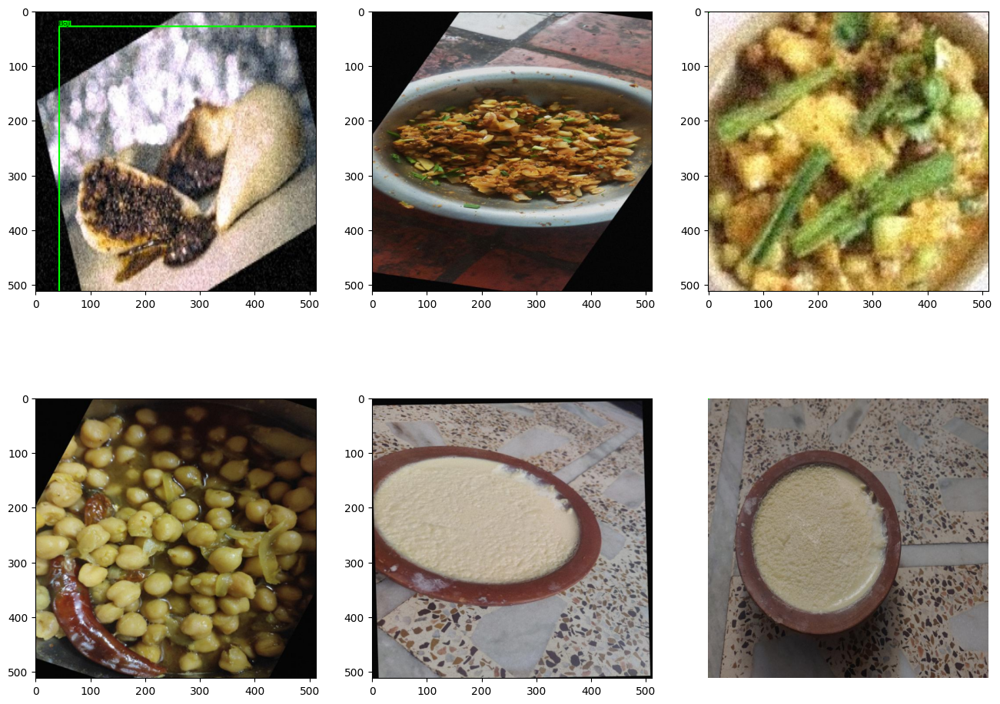

In [33]:
visualize(batch['image'], decoded_pred)

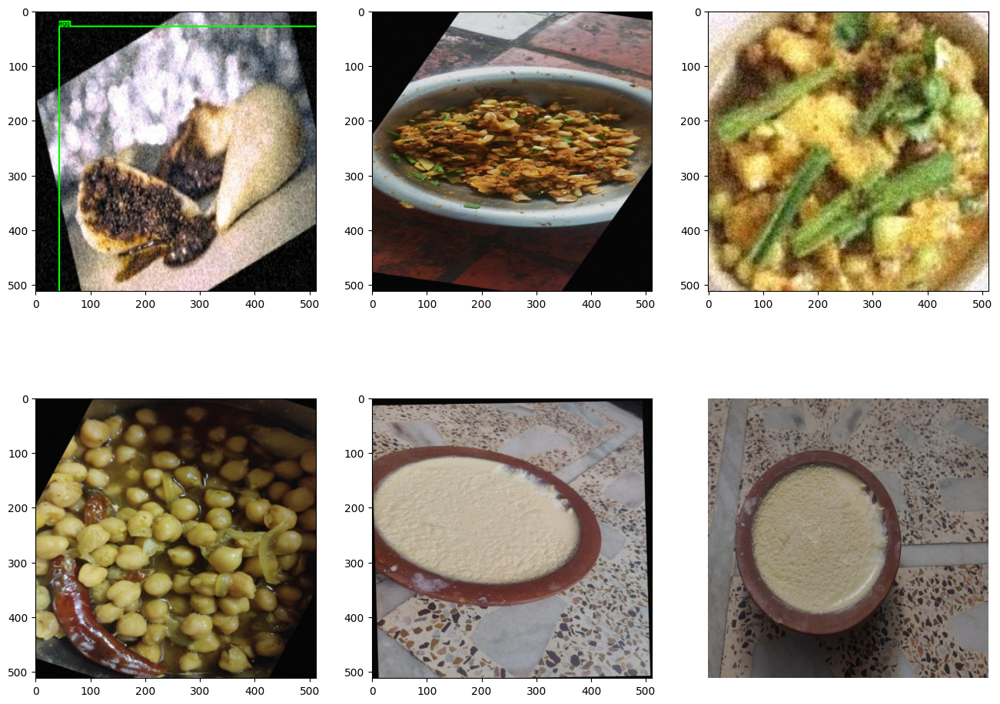

In [34]:
visualize(batch['image'], decode_prediction(pred, threshold=0.8))

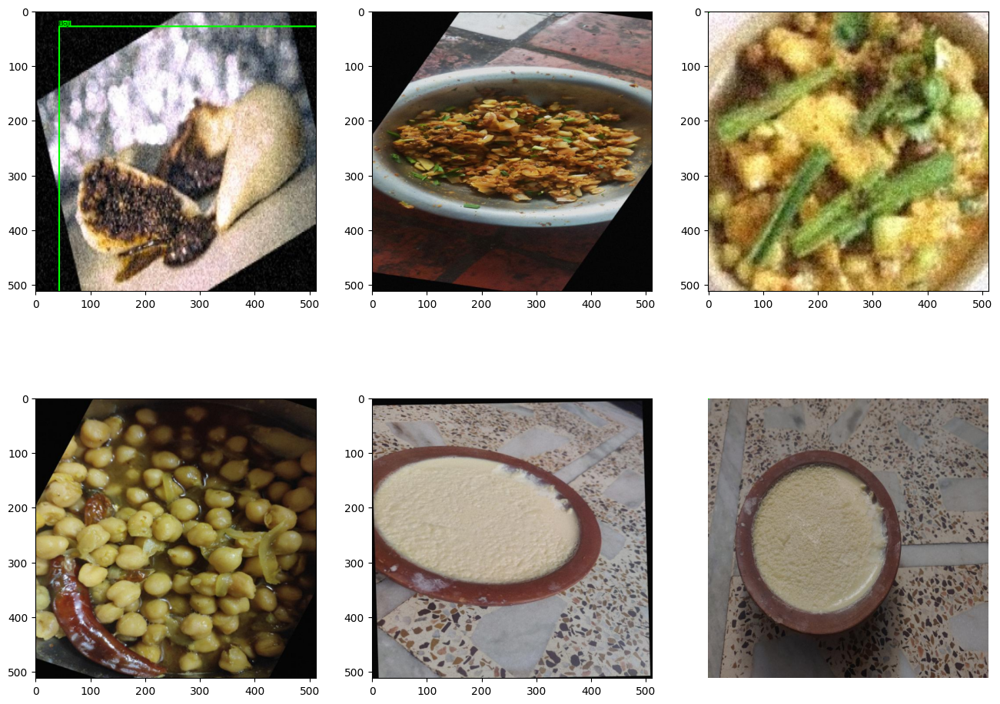

In [35]:
visualize(batch['image'], decode_prediction(pred, threshold=0.3))

* The result is very so-so, right? There are many options for improvements, the easiest of which is to attach it to the output [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). If you want, you can read about YOLO v1 [here](https://arxiv.org/abs/1506.02640).



# YOLO

* Let's move on to simpler things. Let's take a ready-made architecture, train it on our data and see.

For this we will use YOLO v8 from ultralytics.


In [36]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 923.8/923.8 kB 23.0 MB/s eta 0:00:00


## Convert Data to YOLOv8 PyTorch TXT

**[EN]** In order for the model to be trained further in one line, the data must be transferred to the correct format. Yes, yes, classic JSON wrapping. You can see how to pack correctly [here](https://roboflow.com/formats/yolov8-pytorch-txt).

In short:
* There is .yaml, where the paths to folders with pictures, the number of classes and their names live
* There are train valid folders (we will help you collect them), they have two subfolders:
    - The first images, it contains pictures
    - The second labels, it contains files with names like pictures, but instead of expanding the pictures you need .txt, inside the format is as described on Roboflow

**[RU]** Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат. Да-да, классика перекладывания JSON. Как правильно паковать можно посмотреть [тут](https://roboflow.com/formats/yolov8-pytorch-txt).

Если коротко:
* Есть .yaml, где живут пути к папкам с картинками, количество классов и их названия
* Есть папочки train valid (их поможем вам собрать), в них две подпапки:
    - Первая images, в ней лежат картинки
    - Вторая labels, в ней лежат файлы с названиями как у картинок, но вместо расширения картинок нужен .txt, внутри формат как описан на Roboflow


 Let's implement a function that accepts annotations in the original format and returns them in the required format for YOLO v8. This should be an array of ready-made strings that can be immediately thrown into a file by adding \n.


## Fit YOLO

Let's take a non-pretrained model and train it on our dataset.

In [37]:
# from ultralytics import YOLO

# model = YOLO('yolov8n.yaml')

# trained_model = model.train(
#    data='/kaggle/input/newafoodlensdataset/NewaFoodDataset/data.yaml',
#    imgsz=512,
#    epochs=50,
#    batch=6,
#    name='yolov8n_v8_50epoch',
#    pretrained=False
# )

In [38]:
import os
import shutil
import yaml
from ultralytics import YOLO

# ✅ Define dataset paths
BASE_PATH = "/kaggle/input/newafoodlensdataset/NewaFoodDataset"
TRAIN_IMAGES = f"{BASE_PATH}/train/images"
TRAIN_LABELS = f"{BASE_PATH}/train/labels"
VAL_IMAGES = f"{BASE_PATH}/valid/images"
VAL_LABELS = f"{BASE_PATH}/valid/labels"

# ✅ Ensure dataset paths exist
if not os.path.exists(TRAIN_IMAGES) or not os.path.exists(VAL_IMAGES):
    raise FileNotFoundError("⚠️ Error: One or more dataset directories do not exist!")

# ✅ Define `data.yaml` configuration
dataset_config = {
    "train": TRAIN_IMAGES,
    "val": VAL_IMAGES,
    "nc": len(class_dict),  # Number of classes
    "names": list(class_dict.keys()),  # Class names
}

# ✅ Save `data.yaml` file
yaml_path = "/kaggle/working/data.yaml"  # Ensure the correct writable path
with open(yaml_path, "w", encoding="utf-8") as f:
    yaml.dump(dataset_config, f, default_flow_style=False)

# ✅ Load YOLO model
model = YOLO("yolov8n.yaml")  # Load YOLOv8 nano model

# ✅ Train YOLOv8 model using `data.yaml`
trained_model = model.train(
    data=yaml_path,  # Pass YAML file path instead of a dictionary
    imgsz=640,  
    epochs=100,  
    batch=16,  
    name="yolov8n_v8_100epochs",
    pretrained=False,
    verbose=True
)

# ✅ Save trained model
# trained_model.export(format="torchscript")  # Convert model to TorchScript format for inference


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.87 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/kaggle/working/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_v8_100epochs, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False

100%|██████████| 755k/755k [00:00<00:00, 25.3MB/s]


Overriding model.yaml nc=80 with nc=16

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 9.32MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/newafoodlensdataset/NewaFoodDataset/train/labels... 5982 images, 8 backgrounds, 0 corrupt: 100%|██████████| 5982/5982 [00:37<00:00, 160.49it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/newafoodlensdataset/NewaFoodDataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/newafoodlensdataset/NewaFoodDataset/valid/labels... 1513 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1513/1513 [00:09<00:00, 167.56it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/newafoodlensdataset/NewaFoodDataset/valid is not writeable, cache not saved.
Plotting labels to runs/detect/yolov8n_v8_100epochs/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0005, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/yolov8n_v8_100epochs
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.57G      2.893      4.528      3.865         39        640: 100%|██████████| 374/374 [01:14<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:11<00:00,  4.29it/s]


                   all       1513       1523      0.243      0.179     0.0602      0.024

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.83G      1.865      3.568      2.584         41        640: 100%|██████████| 374/374 [01:11<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.52it/s]


                   all       1513       1523      0.167      0.444      0.212       0.11

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.83G      1.435      2.876      2.046         40        640: 100%|██████████| 374/374 [01:10<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.60it/s]

                   all       1513       1523      0.166      0.423      0.203      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.83G      1.341      2.591       1.92         40        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.34it/s]

                   all       1513       1523      0.286      0.566      0.352      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.83G       1.29      2.374      1.855         44        640: 100%|██████████| 374/374 [01:09<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.58it/s]

                   all       1513       1523      0.329      0.634      0.405       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.83G      1.249      2.237      1.811         45        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.69it/s]

                   all       1513       1523      0.391      0.607       0.48      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.83G      1.229      2.119      1.786         40        640: 100%|██████████| 374/374 [01:10<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.74it/s]

                   all       1513       1523       0.52      0.536      0.474      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.83G      1.202      2.036      1.758         36        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.58it/s]

                   all       1513       1523      0.446      0.623      0.522      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.83G      1.189      1.965      1.741         43        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.60it/s]

                   all       1513       1523       0.44      0.664      0.567       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.83G      1.176      1.886      1.725         34        640: 100%|██████████| 374/374 [01:09<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:09<00:00,  5.31it/s]

                   all       1513       1523      0.497      0.668      0.618      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.83G      1.149      1.824      1.708         36        640: 100%|██████████| 374/374 [01:10<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.74it/s]

                   all       1513       1523      0.556      0.646      0.635      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.83G      1.144      1.754      1.691         40        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.84it/s]

                   all       1513       1523      0.555      0.692      0.682      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.83G      1.133      1.699      1.676         36        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.82it/s]

                   all       1513       1523      0.603      0.733      0.717      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.83G      1.127      1.659      1.671         35        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.77it/s]

                   all       1513       1523      0.658      0.742      0.751      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.83G       1.12      1.606      1.664         39        640: 100%|██████████| 374/374 [01:10<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.49it/s]

                   all       1513       1523      0.732      0.716      0.784      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.83G      1.095      1.548      1.641         33        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.40it/s]

                   all       1513       1523      0.718      0.749      0.793      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.83G        1.1       1.52      1.641         44        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.57it/s]

                   all       1513       1523      0.755      0.749      0.817      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.83G        1.1      1.509      1.639         33        640: 100%|██████████| 374/374 [01:10<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.79it/s]

                   all       1513       1523      0.726       0.74      0.797      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.83G      1.093      1.453      1.627         42        640: 100%|██████████| 374/374 [01:10<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.64it/s]

                   all       1513       1523      0.808      0.797      0.862      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.83G      1.085      1.437      1.621         44        640: 100%|██████████| 374/374 [01:09<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.82it/s]

                   all       1513       1523      0.766       0.77       0.84      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.83G      1.083      1.405      1.619         41        640: 100%|██████████| 374/374 [01:10<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.62it/s]

                   all       1513       1523      0.769      0.815      0.856      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.83G      1.072      1.361      1.597         38        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.43it/s]

                   all       1513       1523      0.771      0.799      0.851      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.83G      1.066      1.347      1.605         37        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.37it/s]

                   all       1513       1523       0.82      0.806       0.88      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.83G      1.064      1.329      1.591         33        640: 100%|██████████| 374/374 [01:10<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.74it/s]

                   all       1513       1523      0.818       0.81      0.879      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.83G      1.058      1.291      1.587         37        640: 100%|██████████| 374/374 [01:10<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.70it/s]

                   all       1513       1523       0.83      0.825      0.886      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.83G       1.05      1.287      1.582         40        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:09<00:00,  5.30it/s]

                   all       1513       1523      0.856      0.839      0.902      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.83G       1.06      1.268      1.593         38        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.81it/s]

                   all       1513       1523      0.813      0.831      0.886       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.83G       1.05       1.25      1.578         41        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.67it/s]

                   all       1513       1523      0.881       0.81      0.896      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.83G      1.042      1.206      1.573         36        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.85it/s]

                   all       1513       1523      0.882      0.852      0.912      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.83G      1.034      1.207      1.569         34        640: 100%|██████████| 374/374 [01:09<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.63it/s]

                   all       1513       1523       0.83      0.829      0.892      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.83G      1.028      1.187      1.561         31        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.81it/s]

                   all       1513       1523      0.891      0.853      0.911      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.83G      1.031      1.176      1.557         39        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.48it/s]

                   all       1513       1523      0.886      0.839      0.917      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.83G      1.036      1.164      1.565         38        640: 100%|██████████| 374/374 [01:10<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.73it/s]

                   all       1513       1523      0.891      0.878      0.923      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.83G      1.034      1.153      1.562         33        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.87it/s]

                   all       1513       1523      0.896      0.856      0.923      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.83G      1.022      1.142      1.552         35        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.77it/s]

                   all       1513       1523      0.889      0.876      0.926      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.83G      1.019      1.127      1.549         35        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.77it/s]

                   all       1513       1523      0.899      0.863      0.926      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.83G      1.016      1.104      1.546         33        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.68it/s]

                   all       1513       1523      0.904      0.867      0.928       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.83G      1.022      1.105      1.555         32        640: 100%|██████████| 374/374 [01:09<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.77it/s]

                   all       1513       1523      0.909      0.856      0.926      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.83G      1.016      1.088      1.552         33        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:09<00:00,  5.12it/s]

                   all       1513       1523      0.907      0.879      0.933      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.83G     0.9897      1.055      1.522         33        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.81it/s]

                   all       1513       1523      0.915       0.88      0.939      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.83G     0.9938      1.067      1.528         40        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.78it/s]

                   all       1513       1523      0.916      0.884      0.934      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.83G      1.001      1.071      1.528         35        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.67it/s]

                   all       1513       1523      0.921      0.862      0.932      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.83G     0.9915      1.051      1.528         37        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.78it/s]

                   all       1513       1523      0.908      0.896       0.93      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.83G     0.9967      1.042       1.53         34        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.83it/s]

                   all       1513       1523      0.897      0.893      0.934      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.83G     0.9933      1.026      1.527         32        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.81it/s]

                   all       1513       1523      0.915      0.901      0.938        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      5.83G     0.9859      1.029      1.523         51        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:09<00:00,  5.22it/s]

                   all       1513       1523      0.926      0.897      0.943      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.83G     0.9902      1.018      1.525         32        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.83it/s]

                   all       1513       1523       0.91      0.902      0.944      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.83G     0.9895      1.004      1.527         38        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.73it/s]

                   all       1513       1523      0.925      0.894       0.94        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      5.83G     0.9771      1.003      1.516         34        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.83it/s]

                   all       1513       1523      0.915      0.916      0.946      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      5.83G     0.9888     0.9944      1.519         36        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.78it/s]

                   all       1513       1523      0.915      0.907      0.943        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      5.83G     0.9727     0.9763      1.509         42        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.85it/s]

                   all       1513       1523      0.923      0.908      0.946      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      5.83G     0.9745     0.9771       1.51         38        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.81it/s]

                   all       1513       1523      0.925      0.909      0.951      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      5.83G     0.9661     0.9649      1.506         35        640: 100%|██████████| 374/374 [01:10<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.44it/s]

                   all       1513       1523      0.915      0.915      0.948      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      5.83G     0.9753     0.9704       1.51         39        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.62it/s]

                   all       1513       1523      0.932      0.913      0.947      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      5.83G     0.9617     0.9442      1.499         36        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.68it/s]

                   all       1513       1523      0.926       0.92       0.95      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.83G     0.9602     0.9416      1.502         36        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.82it/s]

                   all       1513       1523      0.936      0.919      0.952       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      5.83G     0.9593     0.9336      1.498         31        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.71it/s]

                   all       1513       1523      0.931      0.921      0.948      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      5.83G     0.9621     0.9372      1.504         41        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.82it/s]

                   all       1513       1523      0.938      0.905      0.949       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      5.83G       0.97     0.9342      1.505         39        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.89it/s]

                   all       1513       1523      0.942      0.906      0.949      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.83G     0.9583     0.9041      1.496         42        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.86it/s]

                   all       1513       1523      0.941      0.914      0.954      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.83G     0.9612     0.9108      1.494         39        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.51it/s]

                   all       1513       1523      0.936      0.913      0.954       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      5.83G     0.9533     0.9083      1.492         43        640: 100%|██████████| 374/374 [01:10<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.39it/s]

                   all       1513       1523      0.942      0.918      0.953      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      5.83G     0.9478     0.8904      1.489         34        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.78it/s]

                   all       1513       1523       0.93      0.929      0.953      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.83G     0.9428     0.8699      1.483         38        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.68it/s]

                   all       1513       1523      0.948      0.922      0.955      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.83G     0.9384     0.8724      1.482         40        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.76it/s]

                   all       1513       1523      0.943      0.923      0.955       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.83G     0.9525     0.8906      1.488         44        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.67it/s]

                   all       1513       1523      0.943      0.923      0.956      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.83G     0.9442     0.8715      1.479         40        640: 100%|██████████| 374/374 [01:10<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.84it/s]

                   all       1513       1523      0.944      0.921      0.954       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.83G      0.945     0.8692      1.479         35        640: 100%|██████████| 374/374 [01:10<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.80it/s]

                   all       1513       1523      0.942      0.926      0.956       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.83G     0.9436     0.8687      1.487         37        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.81it/s]

                   all       1513       1523      0.947      0.921      0.957      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      5.83G     0.9363     0.8561       1.48         36        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:09<00:00,  5.30it/s]

                   all       1513       1523      0.957      0.927       0.96      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.83G     0.9428     0.8624       1.48         28        640: 100%|██████████| 374/374 [01:09<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.61it/s]

                   all       1513       1523      0.941      0.932      0.958      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.83G     0.9313     0.8452      1.473         31        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.74it/s]

                   all       1513       1523      0.947      0.922      0.954       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.83G     0.9258     0.8342       1.47         37        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.74it/s]

                   all       1513       1523      0.951      0.925      0.959       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.83G     0.9233     0.8321      1.473         37        640: 100%|██████████| 374/374 [01:09<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.87it/s]

                   all       1513       1523      0.952      0.931      0.959      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.83G     0.9268     0.8365      1.471         37        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.68it/s]

                   all       1513       1523      0.944      0.933      0.958      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.83G     0.9218     0.8427       1.47         37        640: 100%|██████████| 374/374 [01:10<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.86it/s]

                   all       1513       1523      0.949      0.931      0.956       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.83G     0.9223     0.8133      1.469         36        640: 100%|██████████| 374/374 [01:09<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.82it/s]

                   all       1513       1523      0.953      0.928      0.959      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.83G      0.927     0.8338      1.468         41        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.84it/s]

                   all       1513       1523      0.945       0.93      0.958      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.83G     0.9297     0.8282       1.47         38        640: 100%|██████████| 374/374 [01:09<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.66it/s]

                   all       1513       1523      0.949      0.932      0.959      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.83G     0.9119     0.8128      1.459         38        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:09<00:00,  5.22it/s]

                   all       1513       1523      0.945      0.932      0.958      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.83G      0.914     0.8075      1.458         37        640: 100%|██████████| 374/374 [01:09<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.70it/s]

                   all       1513       1523      0.949      0.934       0.96      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.83G     0.9199     0.8043       1.47         35        640: 100%|██████████| 374/374 [01:09<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.68it/s]

                   all       1513       1523      0.944      0.938       0.96      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.83G     0.9076     0.7974      1.459         33        640: 100%|██████████| 374/374 [01:09<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.96it/s]

                   all       1513       1523      0.955      0.929       0.96      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.83G     0.9046     0.8002      1.451         40        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.77it/s]

                   all       1513       1523      0.937      0.937       0.96      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.83G     0.8998     0.7835       1.45         40        640: 100%|██████████| 374/374 [01:09<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.86it/s]

                   all       1513       1523      0.943      0.935      0.959      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.83G     0.9058     0.7909      1.453         34        640: 100%|██████████| 374/374 [01:09<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.88it/s]

                   all       1513       1523      0.947       0.93      0.958      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.83G      0.907      0.793      1.456         35        640: 100%|██████████| 374/374 [01:09<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.92it/s]

                   all       1513       1523      0.945      0.932      0.959      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.83G     0.9084     0.7837      1.458         39        640: 100%|██████████| 374/374 [01:09<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.80it/s]

                   all       1513       1523       0.95      0.936       0.96       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.83G     0.8984     0.7763       1.45         36        640: 100%|██████████| 374/374 [01:09<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.78it/s]

                   all       1513       1523      0.949      0.936      0.961       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      5.83G     0.9082     0.7757      1.452         39        640: 100%|██████████| 374/374 [01:09<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.74it/s]

                   all       1513       1523      0.952      0.935      0.961       0.63


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.83G     0.8493     0.4995      1.618         14        640: 100%|██████████| 374/374 [01:10<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:09<00:00,  5.10it/s]

                   all       1513       1523      0.944      0.939       0.96      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.83G     0.8394     0.4653      1.603         14        640: 100%|██████████| 374/374 [01:08<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.68it/s]

                   all       1513       1523      0.943       0.94      0.961      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.83G     0.8281     0.4572      1.596         14        640: 100%|██████████| 374/374 [01:08<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.76it/s]

                   all       1513       1523      0.945       0.94      0.962       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.83G     0.8292     0.4454      1.594         14        640: 100%|██████████| 374/374 [01:08<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.76it/s]

                   all       1513       1523      0.947      0.937      0.961      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.83G     0.8235     0.4394      1.592         16        640: 100%|██████████| 374/374 [01:08<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.85it/s]

                   all       1513       1523      0.938      0.946      0.961      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.83G     0.8129     0.4387      1.585         15        640: 100%|██████████| 374/374 [01:08<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.78it/s]

                   all       1513       1523      0.947      0.939      0.961      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.83G     0.8164      0.436       1.58         14        640: 100%|██████████| 374/374 [01:08<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.90it/s]

                   all       1513       1523      0.947      0.938       0.96      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.83G     0.8123      0.428      1.579         14        640: 100%|██████████| 374/374 [01:08<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.67it/s]

                   all       1513       1523      0.948      0.935       0.96      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.83G     0.8073     0.4271      1.573         14        640: 100%|██████████| 374/374 [01:09<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.86it/s]

                   all       1513       1523       0.95      0.937      0.962      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.83G     0.8107     0.4258      1.584         14        640: 100%|██████████| 374/374 [01:08<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.82it/s]

                   all       1513       1523      0.953      0.936      0.963       0.64



100 epochs completed in 2.183 hours.
Optimizer stripped from runs/detect/yolov8n_v8_100epochs/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolov8n_v8_100epochs/weights/best.pt, 6.3MB

Validating runs/detect/yolov8n_v8_100epochs/weights/best.pt...
Ultralytics 8.3.87 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8n summary (fused): 72 layers, 3,008,768 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:09<00:00,  4.94it/s]


                   all       1513       1523      0.953      0.936      0.963       0.64
                  Baji         95         95      0.999      0.958      0.989      0.681
               Dakulaa        101        101      0.936      0.911      0.929      0.707
                  Dhau         89         89      0.905      0.854      0.967      0.747
                 aaloo        101        101      0.945      0.858      0.939      0.533
                  bara         95         97      0.979      0.958      0.993      0.827
                bhutan         87         87      0.922      0.952      0.951      0.695
                 bhuti         93         93      0.977      0.921      0.987      0.812
                channa         90         90      0.948          1      0.982      0.682
                   egg         95         98      0.914      0.867      0.904      0.521
              kachhila        103        103      0.939      0.898      0.932      0.501
           lainTarkar

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/yolov8n_v8_100epochs


## Display predictions

**[EN]** Here you can use trick with the save=True parameter for predict, then read them with something, draw them with matplotlib. There are better options. The default show will try to show through opencv imshow, it will not work in collab.

**[RU]** Здесь можно использовать костыли с параметром save=True у predict, потом прочитать их чем-нибудь, отрисовать матплотлибом. Есть варианты и получше. Дефолтный show будет пытаться показывать через opencv imshow, он в коллабе работать не будет.

In [39]:
results = model(train_ds.filenames[10:20], save=True, project='save_images', name='save_images')


0: 640x640 1 kachhila, 3.8ms
1: 640x640 1 Baji, 3.8ms
2: 640x640 1 sapumicha, 3.8ms
3: 640x640 1 bhutan, 3.8ms
4: 640x640 1 aaloo, 3.8ms
5: 640x640 1 lainTarkari, 3.8ms
6: 640x640 1 sapumicha, 3.8ms
7: 640x640 1 channa, 3.8ms
8: 640x640 1 sapumicha, 3.8ms
9: 640x640 1 thoo, 3.8ms
Speed: 1.4ms preprocess, 3.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to save_images/save_images


<Figure size 1000x1000 with 0 Axes>

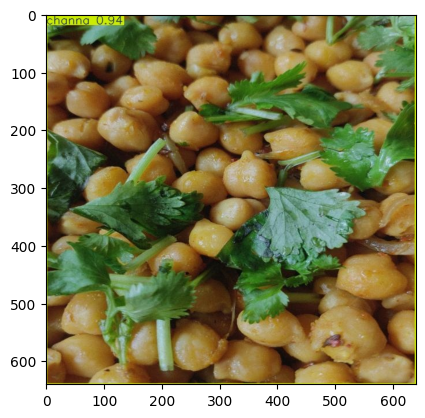

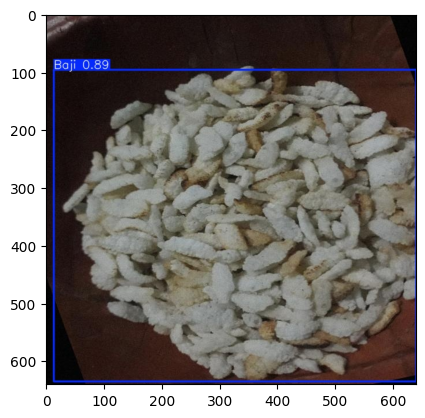

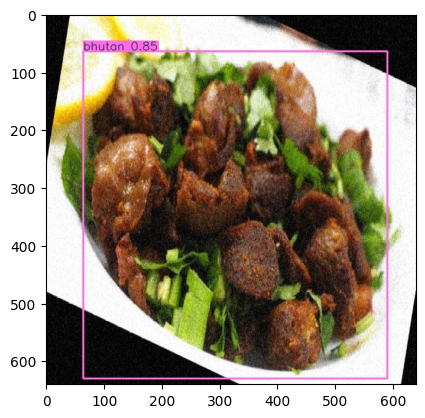

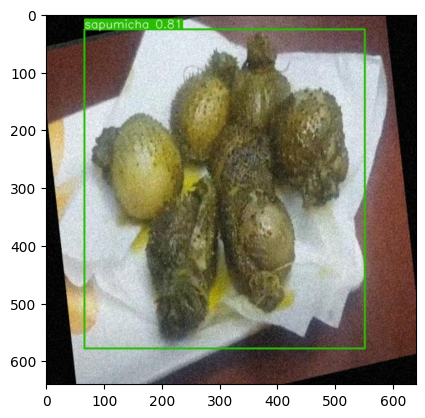

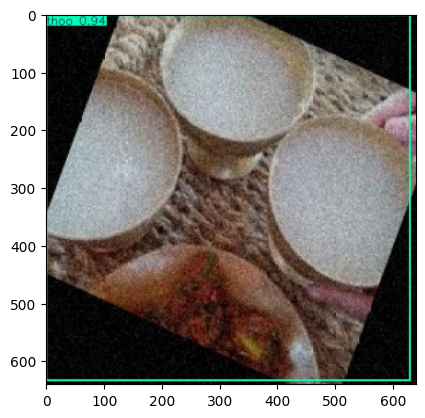

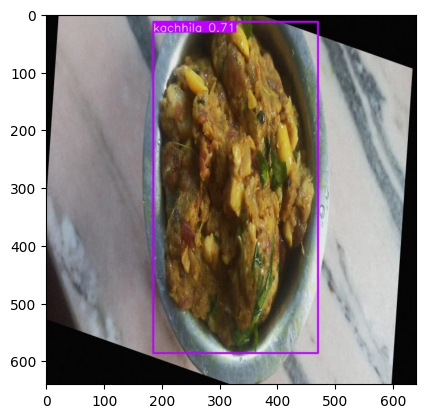

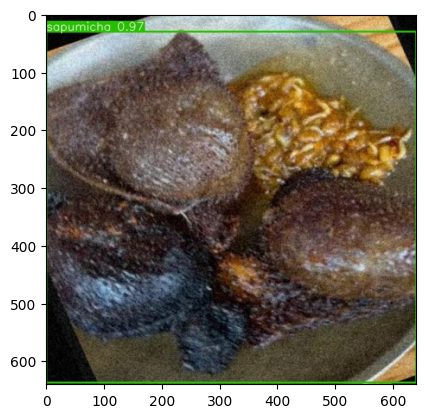

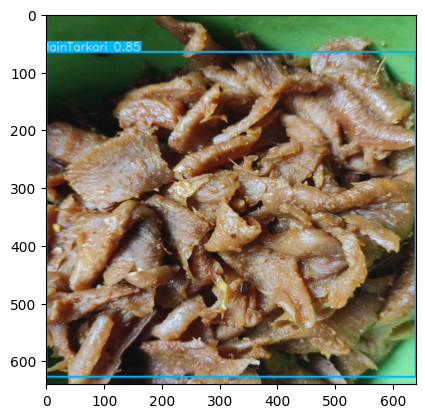

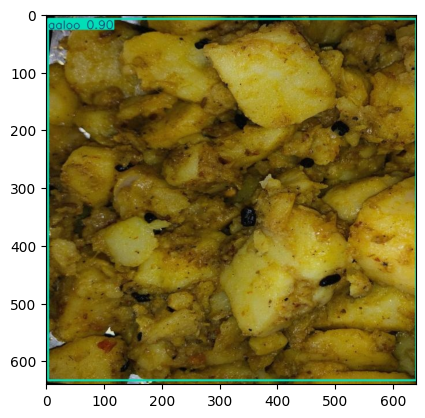

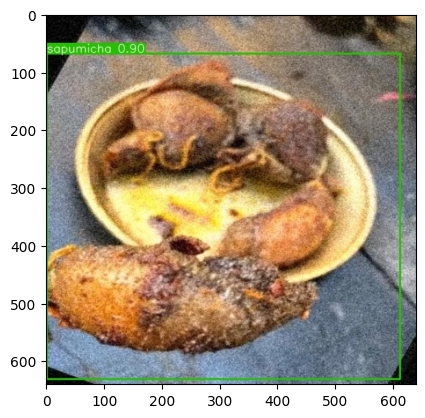

In [40]:
fig = plt.figure(figsize=(10, 10))
img_files = glob.glob('save_images/save_images/*')

for path in img_files:
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure()
    plt.imshow(img)
plt.show()

# ROOC CURVE

In [41]:
from ultralytics import YOLO
import torch

# Load the trained YOLO model
# model = YOLO("/kaggle/input/yolo-model/best_70epochs.pt")
model_yolo_only = YOLO("/kaggle/input/yolo-model/best_yolo_only.pt")

# Run inference on validation images
val_images = "/kaggle/input/newafoodlensdataset/NewaFoodDataset/valid/images"  # Update with actual path
results = model_yolo_only(val_images, save=False)  # Get predictions without saving




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1513 /kaggle/input/newafoodlensdataset/NewaFoodDataset/valid/images/aug_100_jpg.rf.6e34e53b33af89ed74afa8b25caa0bd6.jpg: 640x640 1 lainTarkari, 25.9ms
image 2/1513 /kaggle/input/newafoodlensdataset/NewaFoodDataset/valid/images/aug_105_jpg.rf.23f0c1eaa7b1abf8ee7d556f5361c7ba.jpg: 640x640 1 thoo, 25.9ms
image 3/1513 /kaggle/input/newafoodlensdataset/NewaFoodDataset/valid/images/aug_106_jpg.rf.38cbc35547b9b8db3bf1e9f3c2388a1f.jpg: 640x640 1 kachhi

In [42]:
import numpy as np
from sklearn.preprocessing import label_binarize

# Placeholder for ground-truth labels and predicted probabilities
y_true = []
y_scores = []

num_classes = 16  # Update based on your dataset

# Process predictions
for result in results:
    for det in result.boxes.data:  # Iterate through detected objects
        class_id = int(det[5].item())  # Get predicted class ID
        confidence = det[4].item()  # Get confidence score

        y_true.append(class_id)
        y_scores.append(confidence)

# Convert lists to NumPy arrays
y_true = np.array(y_true)
y_scores = np.array(y_scores)

# One-hot encode y_true for multi-class ROC curve
y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))

print(f"Shape of y_true_bin: {y_true_bin.shape}")
print(f"Shape of y_scores: {y_scores.shape}")


Shape of y_true_bin: (1543, 16)
Shape of y_scores: (1543,)


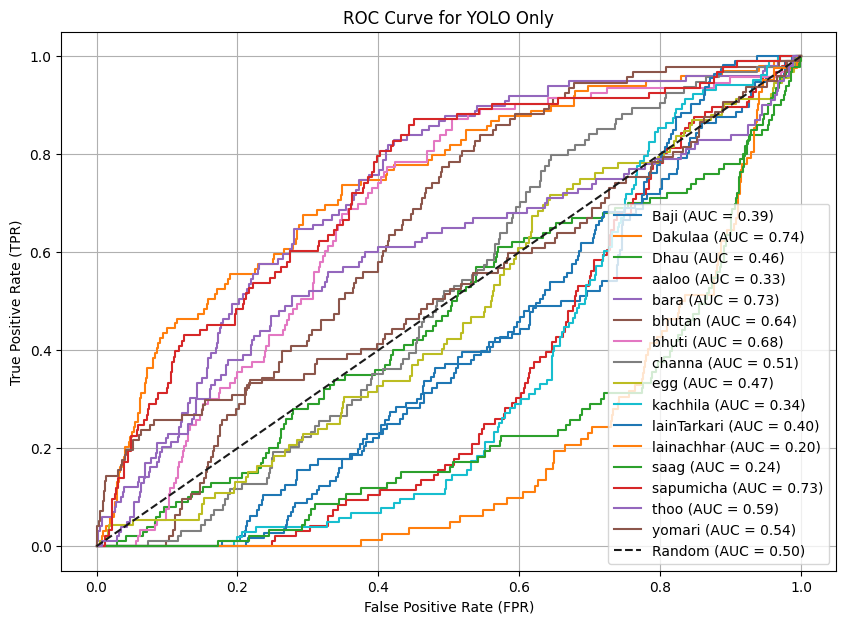

In [43]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Define class names in order
class_names = [
    "Baji", "Dakulaa", "Dhau", "aaloo", "bara", "bhutan", "bhuti", "channa",
    "egg", "kachhila", "lainTarkari", "lainachhar", "saag", "sapumicha", "thoo", "yomari"
]

plt.figure(figsize=(10, 7))

# Compute ROC for each class
for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.2f})')

# Plot the baseline (random classifier)
plt.plot([0, 1], [0, 1], 'k--', label='Random (AUC = 0.50)')

plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curve for YOLO Only")
plt.legend(loc="lower right", fontsize=10)
plt.grid()
plt.show()
